In [2]:
import pickle
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import seaborn as sns

from modules.calibration import draw_keypoints_and_match, drawlines, RANSAC_F_mat, compute_Essential_matrix
from modules.correspondence import ssd_correspondence
from modules.depth import disparity_to_depth
from modules import draw_show_img_utils as dsiu
from modules.rectification import rectification

from gallery.cencus import cencus_correspondence
from datasets.load_dataset import Data

In [3]:
def RMSE_l2(x, y, eval_func=np.average):
    return eval_func((x-y)**2)

## Main 

- Note: This takes a long time to run (~15 mins) so i put it in a pickle

In [21]:
f_diff = list()
d_diff = list()
displ_n = list()
dispr_n = list()

for i in range(6):
    data = Data(i+2)
    print(i+2)
    img1 = data.img1
    img2 = data.img2
    list_kp1, list_kp2, matched_image = draw_keypoints_and_match(img1, img2)
    F = RANSAC_F_mat(list_kp1, list_kp2)
    K1 = data.calib["cam0"]
    K2 = data.calib["cam1"]
    E = compute_Essential_matrix(F, K1, K2)
    pts1 = np.asarray(list_kp1, dtype=np.float32)
    pts2 = np.asarray(list_kp2, dtype=np.float32)

    f_diff.append(RMSE_l2(F, cv2.findFundamentalMat(list_kp1, list_kp2)[0]))

    # # left corresspondence
    # _, disparity_map_scaled = ssd_correspondence(
    #     img1, img2, 15, x_search_block_size=50) 

    # img_n = cv2.normalize(src=disparity_map_scaled, dst=None, alpha=0,
    #                         beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # d_diff.append(RMSE_l2(img_n, data.GTruth))

    # displ_n.append(img_n)

    # # right corresspondence
    # _, disparity_map_scaled = ssd_correspondence(img2, img1, 15, x_search_block_size= 50)  

    # img_n = cv2.normalize(src=disparity_map_scaled, dst=None, alpha=0,
    #                         beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # dispr_n.append(img_n)


# with open(os.path.join("gallery", "displ_n15"), "wb") as file:
#     pickle.dump(displ_n, file)
# with open(os.path.join("gallery", "dispr_n15"), "wb") as file:
#     pickle.dump(dispr_n, file)
f_diff

2
3
4
5
6
7


[0.12096126508598627,
 0.11089916541357171,
 0.008062249241351668,
 0.025290632919402166,
 0.0003396362250035863,
 7.674281892114204e+21]

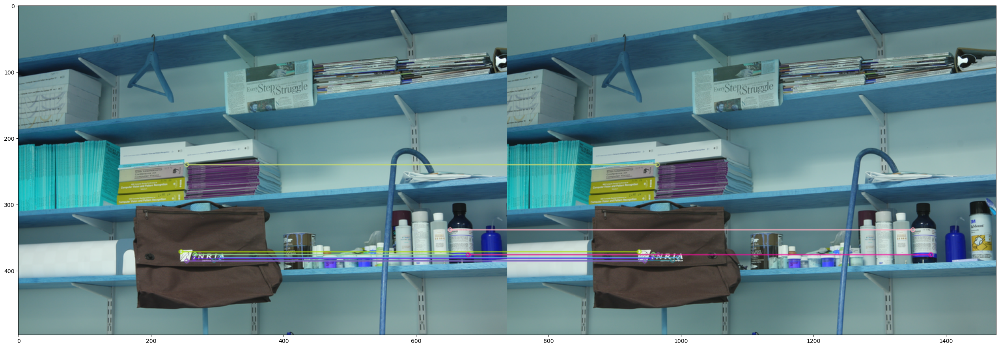

In [5]:
plt.figure(figsize=(32,24))
plt.imshow(matched_image)

In [6]:
with open(r"D:\code\py_steoreo_depth_estimation\gallery\displ_n15", "rb") as file:
    displ_n= pickle.load(file)

with open(r"D:\code\py_steoreo_depth_estimation\gallery\dispr_n15", "rb") as file:
    dispr_n = pickle.load(file)

## Preparing SGM and Ground Truth data

In [7]:
sgm_disp = list()

for i in range(2,8):
    data = Data(i)

    # Create StereoSGBM object
    window_size = 5
    min_disp = -1
    num_disp = 16 * 4 #  Must be divisible by 16

    stereo = cv2.StereoSGBM.create(
        minDisparity=0,
        numDisparities=num_disp,
        blockSize=window_size,
        P1=8 * 3 * window_size ** 2,
        P2=32 * 3 * window_size ** 2,
        disp12MaxDiff=1,
        uniquenessRatio=15,
        speckleWindowSize=50,
        speckleRange=2,
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
    )

    disparity = stereo.compute(data.img1, data.img2)  .astype(np.float32) / 16

    #  Normalize and display the disparity map
    disparity = cv2.normalize(disparity, None, alpha=0,
    beta=255, norm_type=cv2.NORM_MINMAX).astype(np.uint8)
    
    sgm_disp.append(disparity)

([5520.8145, 6802.5195, 7801.771, 6582.5044, 5902.525, 4298.061],
 [6146.622, 3445.091, 14221.887, 5663.022, 7064.0605, 8651.353])

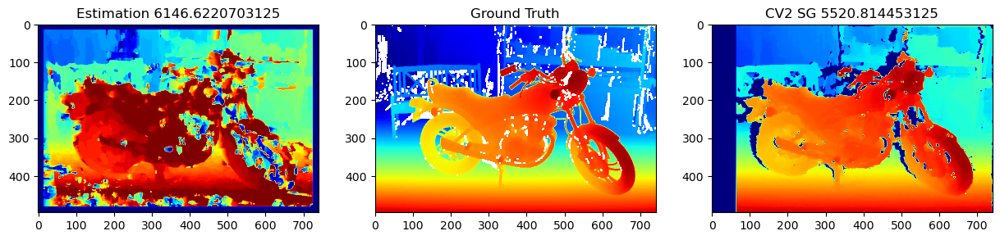

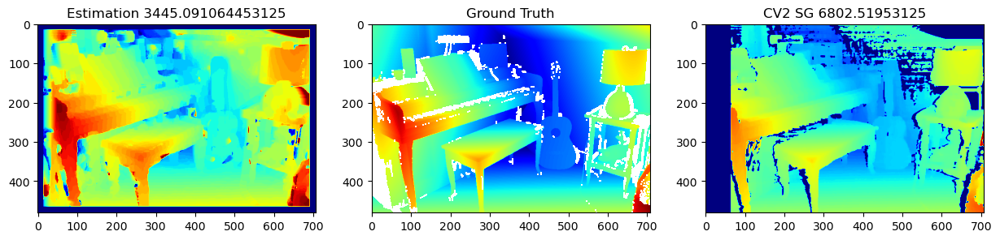

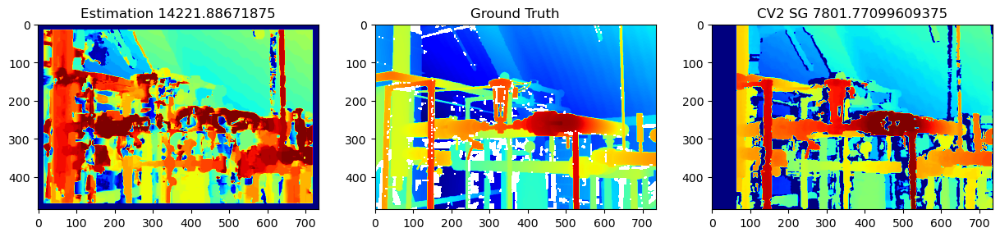

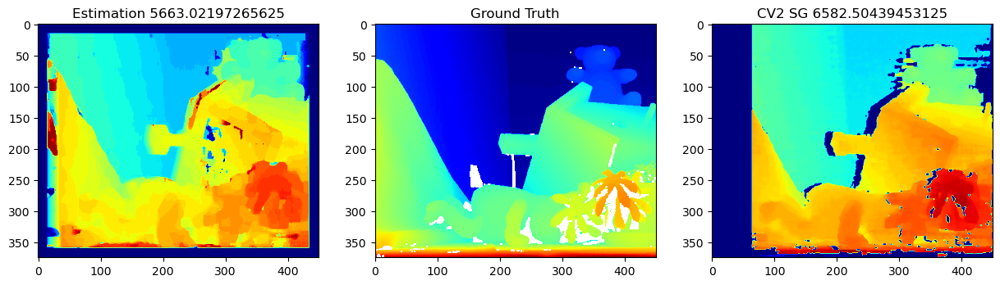

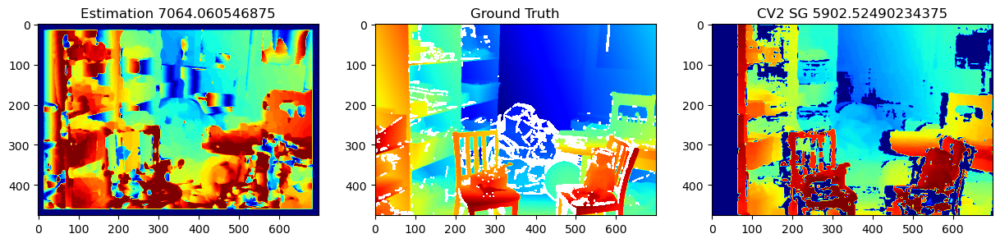

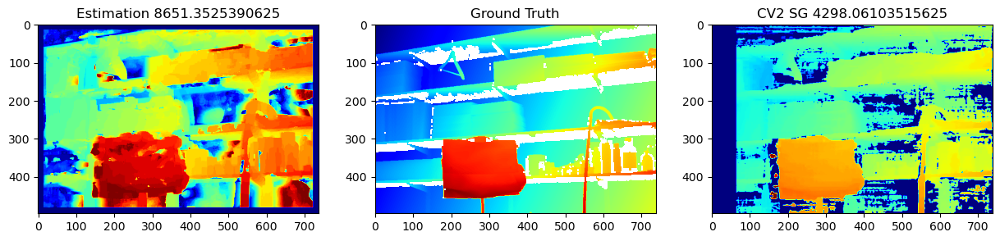

In [8]:
sgm_l2 = list()
gt_l2 = list()


sgm_yslice = slice(15,-15)
gt_slice = slice(15, None)


for i, tup in enumerate(zip(displ_n, sgm_disp)):
    data = Data(i+2)
    est, sgm = tup

    gt = data.GTruth.copy()
    gt[np.isposinf(gt)] = data.calib["ndisp"]
    gt_l2.append(RMSE_l2(est[gt_slice,gt_slice], gt[gt_slice, gt_slice]))
    
    sgm_l2.append(
        RMSE_l2(gt[:, sgm_yslice], sgm[:, sgm_yslice]))
    
    dsiu.draw_many_imgs([est, data.GTruth, sgm], [
                        f"Estimation {gt_l2[i]}", "Ground Truth", f"CV2 SG {sgm_l2[i]}"], cmap="jet")
        
    
sgm_l2, gt_l2

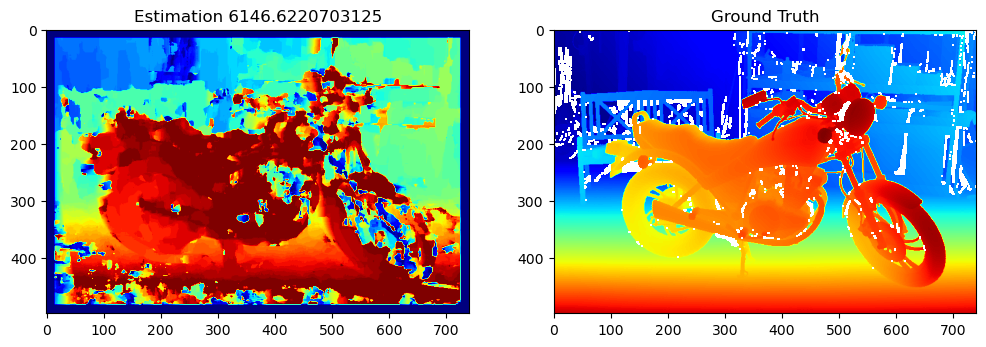

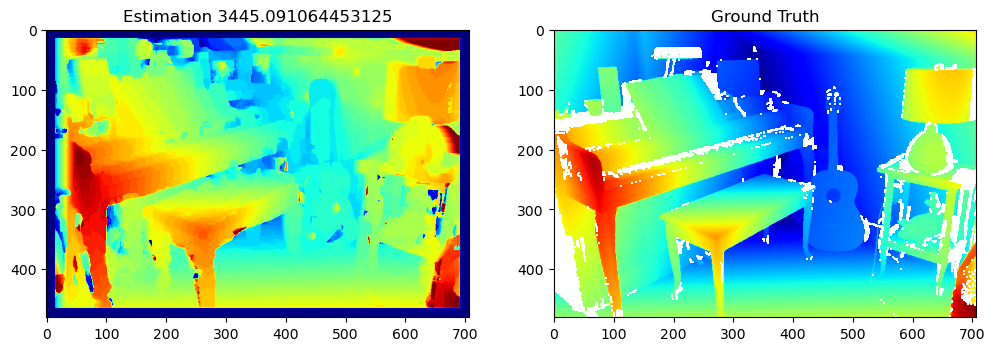

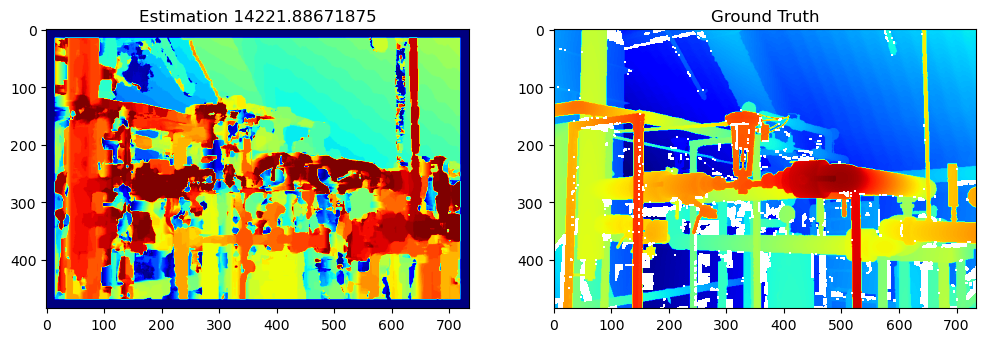

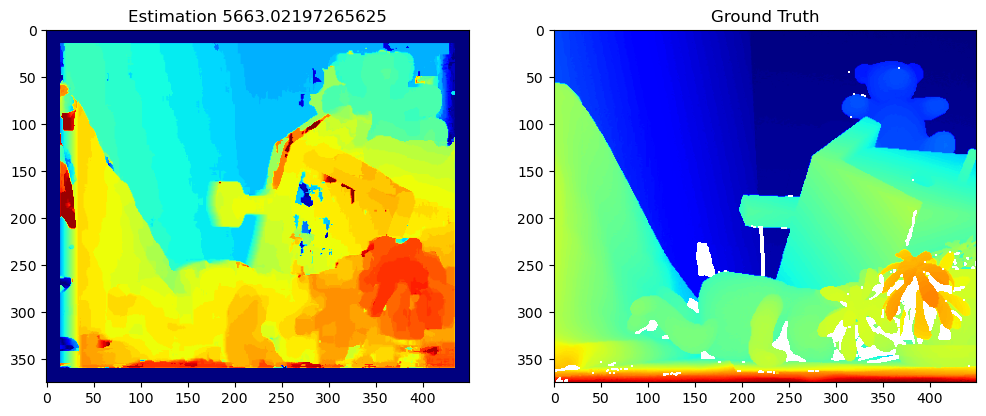

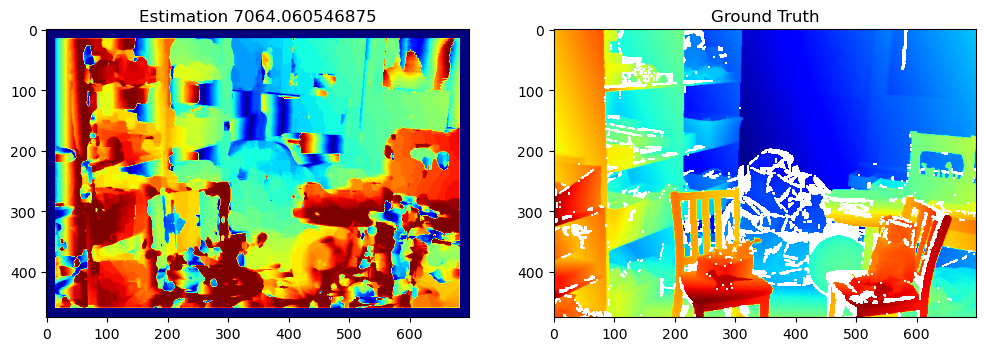

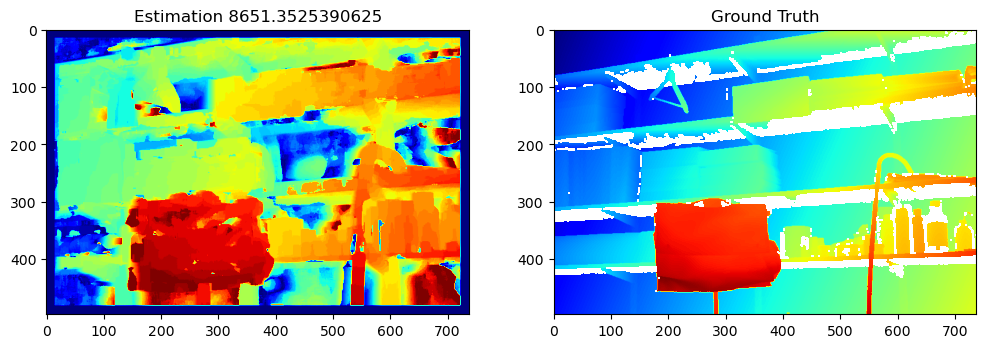

In [9]:
for i in range(6):
    data = Data(i+2)
    dsiu.draw_2_img(displ_n[i], data.GTruth,f"Estimation {gt_l2[i]}","Ground Truth", cmap="jet", figsize=(12,8))

<Axes: title={'center': 'RMSE error of Estimation and Semi Global Matching'}>

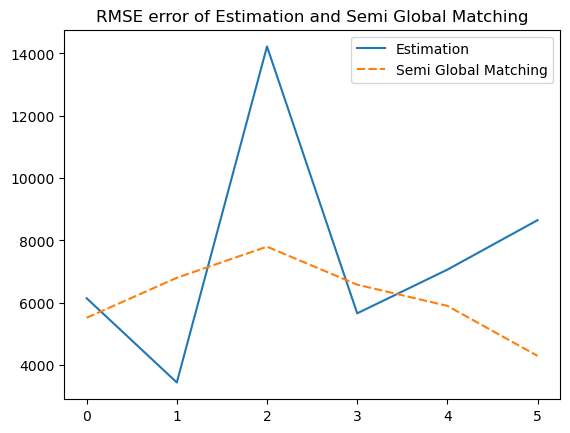

In [10]:
dfsgme = pd.DataFrame({"Estimation" : gt_l2, "Semi Global Matching": sgm_l2})
plt.title("RMSE error of Estimation and Semi Global Matching")
sns.lineplot(dfsgme)

In [11]:
dfsgme["Estimation"].describe()

count        6.000000
mean      7532.005371
std       3697.071289
min       3445.091064
25%       5783.921997
50%       6605.341309
75%       8254.529541
max      14221.886719
Name: Estimation, dtype: float64

## Grid Search to find the best lambda

In [12]:
# lams = list()
# filtered_l2 = list()

# for i in range(6):
#     print(i + 2)
#     data = Data(i+2)

#     bst_l2 = None
#     bst_lam = 0

#     for lam in np.arange(8273000, 9000000, 500):

#         smoother = cv2.ximgproc.createFastGlobalSmootherFilter(
#             data.img1, lam,  1.5)
#         smoothed_img = smoother.filter(displ_n[i])
#         gt = data.GTruth
#         gt[np.isinf(gt)] = data.calib["ndisp"]
                
#         if np.all(np.isinf(smoothed_img)):
#             break

#         if bst_l2 is None or RMSE_l2(smoothed_img, data.GTruth) < bst_l2:
#             bst_l2 = RMSE_l2(smoothed_img, data.GTruth)
#             bst_lam = lam
    
#     filtered_l2.append(bst_l2)
#     lams.append(bst_lam)

lams = [8362000, 8388000, 8273000, 8703000, 8273000, 8273000]
filtered_l2 = [3882.3206, 2278.4434, 9252.567, 4153.2295, 3262.8843, 4209.472]
lam_bst = np.average(lams).astype(np.int32)
lams, filtered_l2, gt_l2

([8362000, 8388000, 8273000, 8703000, 8273000, 8273000],
 [3882.3206, 2278.4434, 9252.567, 4153.2295, 3262.8843, 4209.472],
 [6146.622, 3445.091, 14221.887, 5663.022, 7064.0605, 8651.353])

## Filter Unfiltered

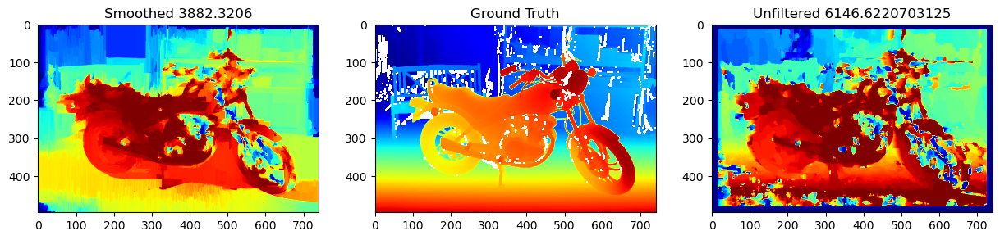

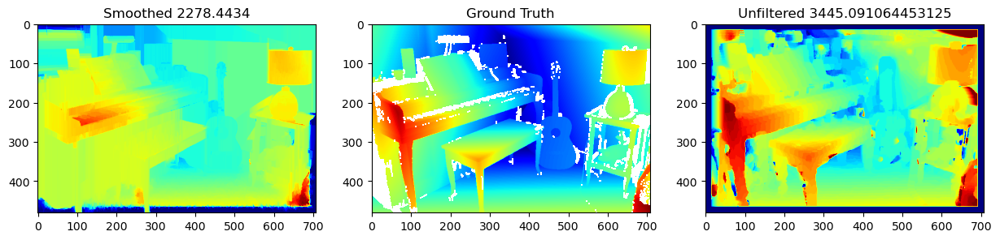

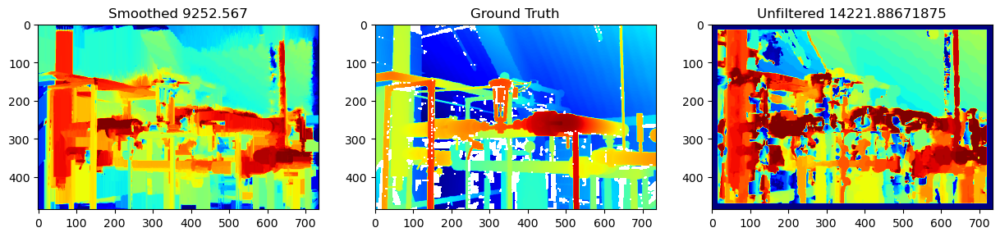

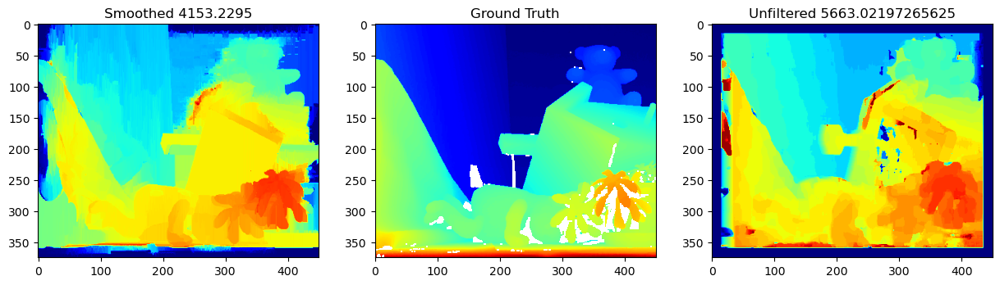

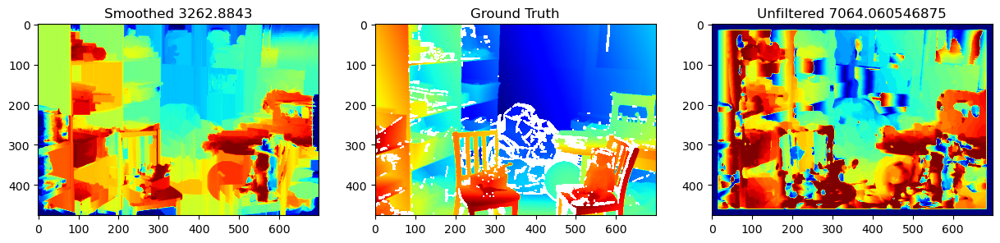

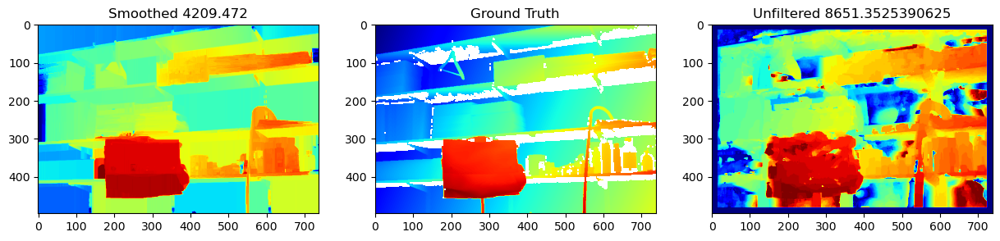

In [13]:
for i in range(len(displ_n)):
    data = Data(i+2)
    smoother = cv2.ximgproc.createFastGlobalSmootherFilter(
        data.img1, lam_bst, 1.5)
    smoothed_img = smoother.filter(displ_n[i])
    dsiu.draw_many_imgs([smoothed_img, data.GTruth, displ_n[i]], [f"Smoothed {filtered_l2[i]}", "Ground Truth", f"Unfiltered {gt_l2[i]}"], cmap="jet")

## Many Filters

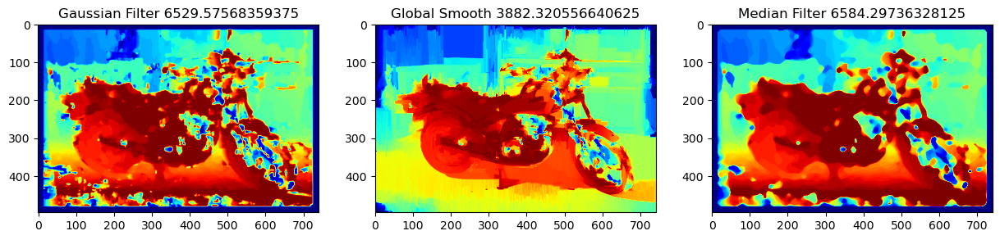

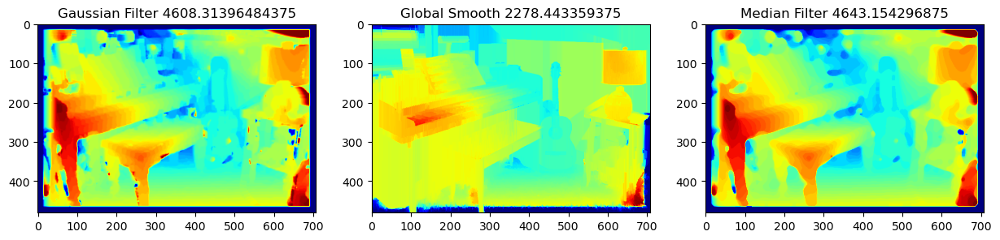

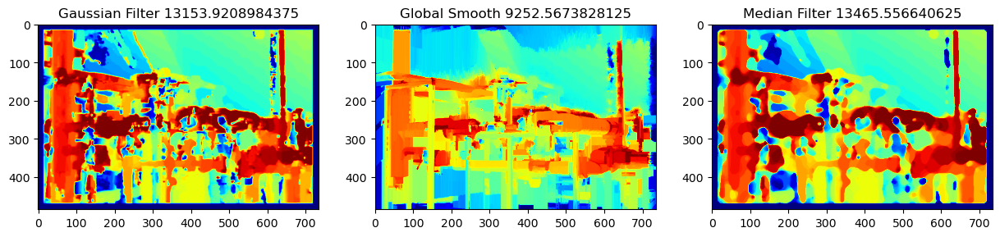

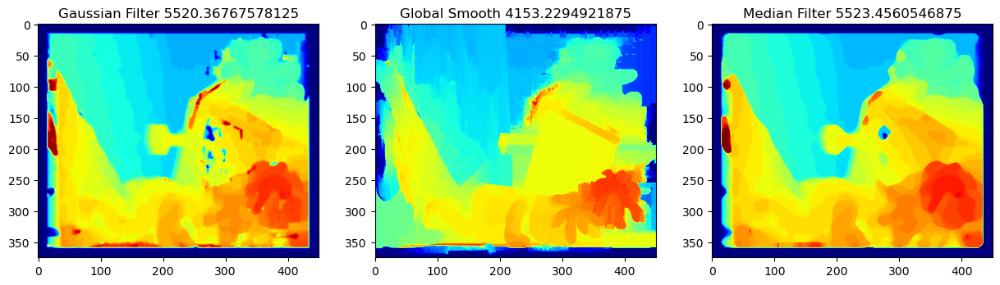

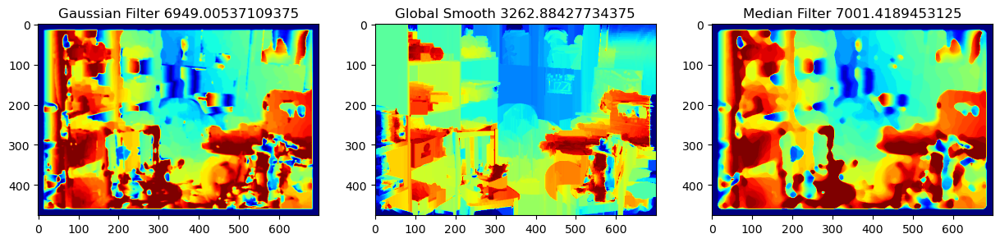

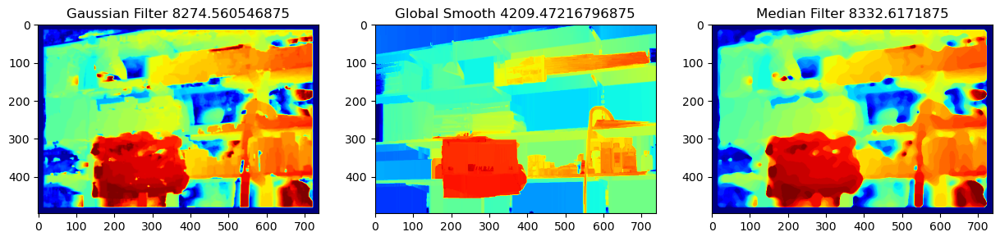

In [14]:
mean_l2 = list()
gasu_l2 = list()
glof_l2 = list()

for i in range(len(displ_n)):
    data = Data(i+2)
    smoother = cv2.ximgproc.createFastGlobalSmootherFilter(
        data.img1, lams[i], 1.5)
    smoothed_img = smoother.filter(displ_n[i])
    
    gasu = cv2.GaussianBlur(displ_n[i], (15,15), 1)
    men = cv2.medianBlur(displ_n[i], 15)
    
    gt = data.GTruth
    gt[np.isinf(gt)] = data.calib["ndisp"]
    
    gasu_l2.append(RMSE_l2(gasu, gt))
    mean_l2.append(RMSE_l2(men, gt))
    glof_l2.append(RMSE_l2(smoothed_img, gt))
    
    dsiu.draw_many_imgs([gasu, smoothed_img, men], [f"Gaussian Filter {gasu_l2[i]}", f"Global Smooth {glof_l2[i]}", f"Median Filter {mean_l2[i]}"], cmap="jet")
    

## Plot the RMSEs

<Axes: >

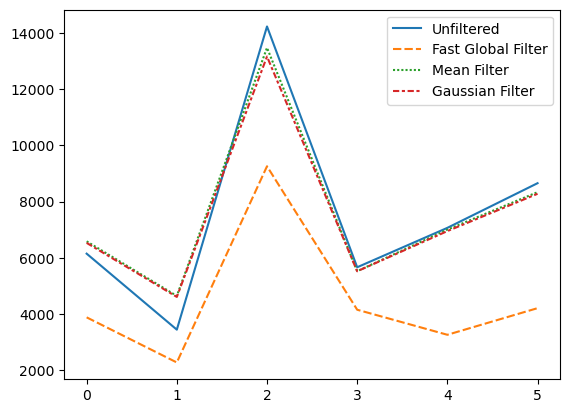

In [15]:
df = pd.DataFrame({"Unfiltered":gt_l2 ,"Fast Global Filter": glof_l2, "Mean Filter": mean_l2, "Gaussian Filter": gasu_l2})
sns.lineplot(df)

## Cencus

In [16]:
# cencus_l2 = list()
# cencus_disp = list()

# for i in range(len(displ_n)):
#     data = Data(i+2, cv2.IMREAD_GRAYSCALE)
#     img1 = data.img1
#     img2 = data.img2

#     gt = data.GTruth
#     gt[np.isinf(gt)] = data.calib["ndisp"]

#     # left corresspondence
#     _, disparity_map_scaled = cencus_correspondence(
#         img1, img2, 5, x_search_block_size=50)

#     img_n = cv2.normalize(src=disparity_map_scaled, dst=None, alpha=0,
#                         beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    
#     cencus_disp.append(img_n)
#     cencus_l2.append(RMSE_l2(img_n, gt))
        
#     dsiu.draw_many_imgs([img_n,  data.GTruth, displ_n[i]], [f"Cencus Transform {cencus_l2[i]}", "Ground Truth", f"Estimation {gt_l2[i]}"], cmap="jet")

In [17]:
# with open(os.path.join("gallery", "cencusl_n15"), "wb") as file:
#     pickle.dump(cencus_disp, file)

with open(os.path.join("gallery", "cencusl_n15"), "rb") as file:
    cencus_disp= pickle.load(file)

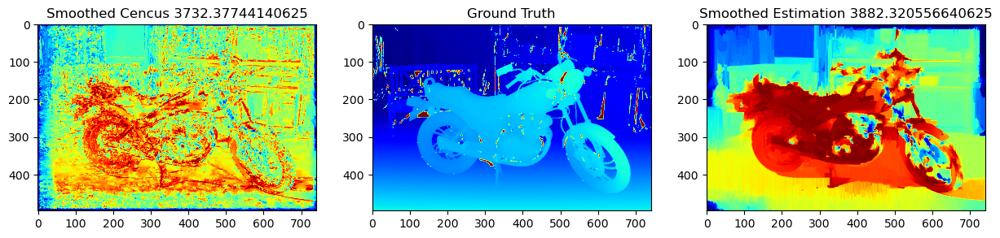

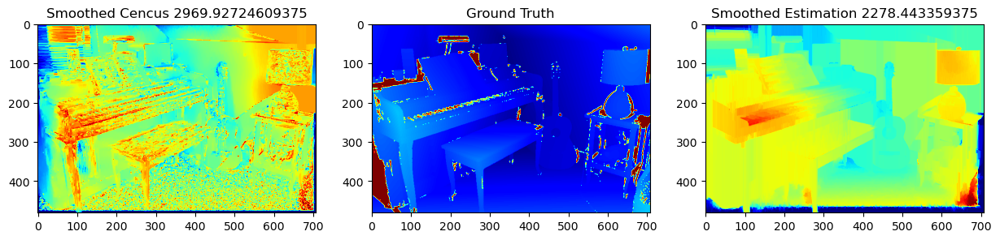

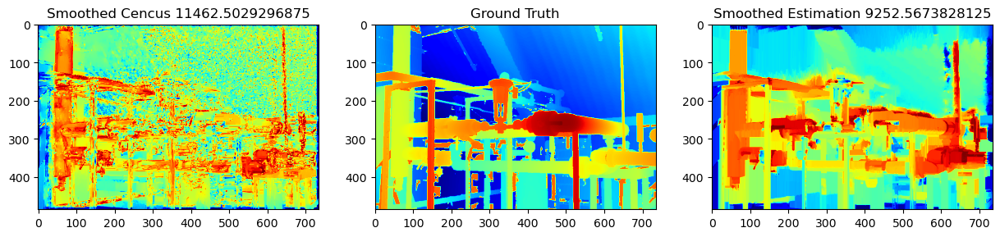

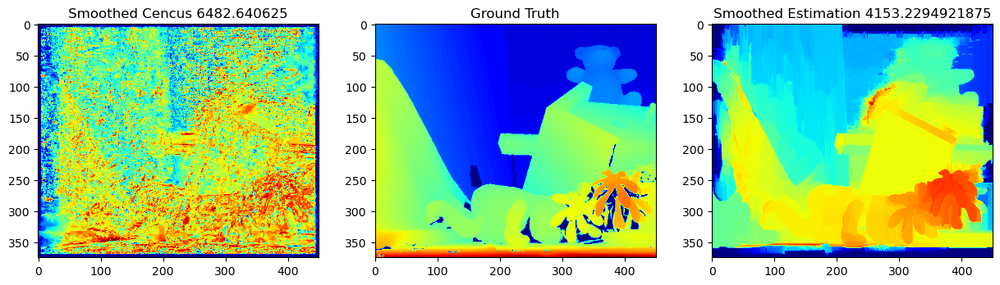

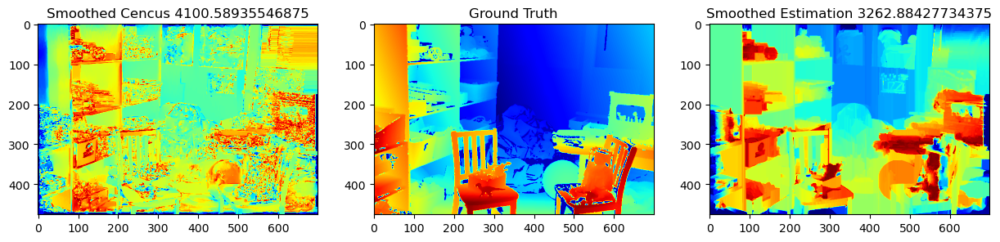

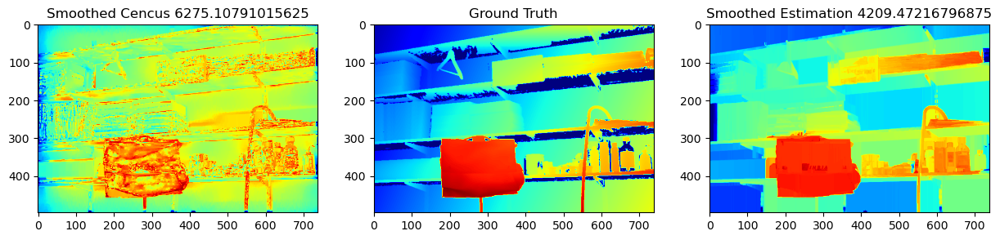

In [18]:
smoothed_cencus_l2 = list()

for i in range(len(displ_n)):
    data = Data(i+2)
    
    gt = data.GTruth
    gt[np.isinf(gt)] = data.calib["ndisp"]
    
    smoother = cv2.ximgproc.createFastGlobalSmootherFilter(data.img1, 8273000, 0.3)
    smoothed_cencus = smoother.filter(cencus_disp[i])    
    smoothed_cencus_l2.append(RMSE_l2(smoothed_cencus, gt))
    
    smoother = cv2.ximgproc.createFastGlobalSmootherFilter(
        data.img1, lams[i], 1.5)
    smoothed_img = smoother.filter(displ_n[i])

    dsiu.draw_many_imgs([smoothed_cencus, data.GTruth, smoothed_img], [f"Smoothed Cencus {
                        smoothed_cencus_l2[i]}", "Ground Truth", f"Smoothed Estimation {glof_l2[i]}"], cmap="jet")

In [19]:
cencus_l2 = list()

for i in range(6):
    data = Data(i+2)
    gt=data.normalized_gtruth()
    
    cencus_l2.append(RMSE_l2(cencus_disp[i], gt))

<Axes: title={'center': 'RMSE comparision'}>

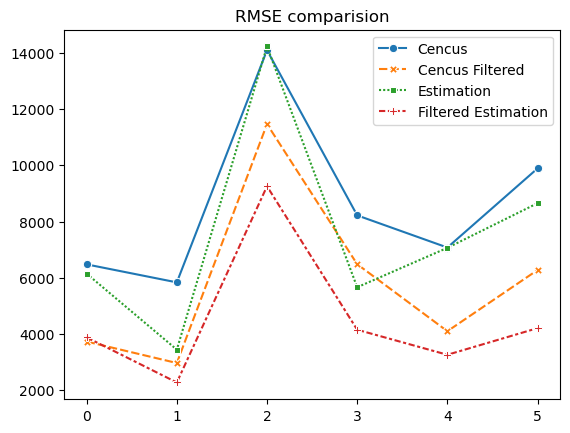

In [20]:
df3 = pd.DataFrame({"Cencus": cencus_l2, "Cencus Filtered":smoothed_cencus_l2,
                    "Estimation":gt_l2, "Filtered Estimation":glof_l2})

plt.title("RMSE comparision")
sns.lineplot(df3, markers= True, dashes= True)